# Lead Score Assignment

## Goal:
1. Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.
2. There are some more problems presented by the company which your model should be able to adjust to if the company's requirement changes in the future so you will need to handle these as well. These problems are provided in a separate doc file. Please fill it based on the logistic regression model you got in the first step. Also, make sure you include this in your final PPT where you'll make recommendations.

## Following steps are performed:
- Reading and Understanding the data
- Data Cleaning
- Outlier Analysis
- Visualising Data (EDA)
- Creating dummy variables
- Splitting the Data into Training and Testing Sets
- Feature Scaling
- Correlations Analysis
- Feature Selection
- Model Building-Assessing the model with StatsModels
- Creating Predictions
- Model Evaluation
- Finding Optimal Cutoff Threshold point
- Making predictions on the test set

In [6]:
# necessary imports
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from pylab import *
import seaborn as sns
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve

## Reading and understanding the data

In [97]:
df = pd.read_csv("Leads.csv")

In [98]:
# observe 5 sample records
df.sample(5)

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
1081,18678c43-29f7-4876-b618-5e4ab7cadf5b,648494,API,Direct Traffic,No,No,0,3.0,129,3.0,...,No,Select,Mumbai,02.Medium,02.Medium,13.0,16.0,No,Yes,Email Opened
3546,7cf260fb-5964-4d82-88fa-b4df0a0d7be3,626497,API,Olark Chat,No,No,1,0.0,0,0.0,...,No,Select,Select,NaN,NaN,NaN,NaN,No,No,SMS Sent
8050,317501bd-888f-4edc-ba62-4d7db7f6b932,588124,Landing Page Submission,Organic Search,No,No,1,9.0,986,9.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,17.0,No,Yes,SMS Sent
4746,34128a89-3ee9-4852-b782-711e42a30cff,614282,Landing Page Submission,Direct Traffic,No,No,0,4.0,21,4.0,...,No,Select,Mumbai,NaN,NaN,NaN,NaN,No,No,SMS Sent
3261,289b8a36-a430-4e78-bff3-ee4c13c63c67,628726,API,Olark Chat,No,No,1,0.0,0,0.0,...,No,Select,Select,NaN,NaN,NaN,NaN,No,No,Modified


In [99]:
# shape of dataframe (rowsxcols)
df.shape

(9240, 37)

In [100]:
# Detailed info of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [101]:
# Checking the statistical information: 5 points summary, mean, std etc for numerical variables
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


## Data Cleaning 

In [102]:
# Replacing 'Select' with NaN (Since it means no option is selected)
df = df.replace('Select',np.nan)
df = df.replace('select',np.nan)

In [103]:
# Finding the null values in descneding order
df.isnull().sum().sort_values(ascending=False)

How did you hear about X Education               7250
Lead Profile                                     6855
Lead Quality                                     4767
Asymmetrique Profile Score                       4218
Asymmetrique Activity Score                      4218
Asymmetrique Activity Index                      4218
Asymmetrique Profile Index                       4218
City                                             3669
Specialization                                   3380
Tags                                             3353
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
Page Views Per Visit                              137
TotalVisits                                       137
Last Activity                                     103
Lead Source                                        36
Receive More Updates About Our Courses              0
I agree to pay the amount th

In [104]:
# Percentage of null values in descneding order
round(df.isnull().sum().sort_values(ascending=False) / df.shape[0] * 100, 1)

How did you hear about X Education               78.5
Lead Profile                                     74.2
Lead Quality                                     51.6
Asymmetrique Profile Score                       45.6
Asymmetrique Activity Score                      45.6
Asymmetrique Activity Index                      45.6
Asymmetrique Profile Index                       45.6
City                                             39.7
Specialization                                   36.6
Tags                                             36.3
What matters most to you in choosing a course    29.3
What is your current occupation                  29.1
Country                                          26.6
Page Views Per Visit                              1.5
TotalVisits                                       1.5
Last Activity                                     1.1
Lead Source                                       0.4
Receive More Updates About Our Courses            0.0
I agree to pay the amount th

We can observe from the above information that many columns have more than 45% of missing values. It's ideal to drop them, since it would not be appropriate to fill massive missing vlaues with any statistic.

In [105]:
for col in df.columns:
    if df[col].isnull().sum() / len(df) > 0.45:
        print(col , "has the null values: " , df[col].isnull().sum())
        df.drop(col , 1 , inplace=True)
        print("Dropped" , col)

How did you hear about X Education has the null values:  7250
Dropped How did you hear about X Education
Lead Quality has the null values:  4767
Dropped Lead Quality
Lead Profile has the null values:  6855
Dropped Lead Profile
Asymmetrique Activity Index has the null values:  4218
Dropped Asymmetrique Activity Index
Asymmetrique Profile Index has the null values:  4218
Dropped Asymmetrique Profile Index
Asymmetrique Activity Score has the null values:  4218
Dropped Asymmetrique Activity Score
Asymmetrique Profile Score has the null values:  4218
Dropped Asymmetrique Profile Score


In [106]:
# Percentage of null values in descneding order
round(df.isnull().sum().sort_values(ascending=False) / df.shape[0] * 100, 1)

City                                             39.7
Specialization                                   36.6
Tags                                             36.3
What matters most to you in choosing a course    29.3
What is your current occupation                  29.1
Country                                          26.6
Page Views Per Visit                              1.5
TotalVisits                                       1.5
Last Activity                                     1.1
Lead Source                                       0.4
Through Recommendations                           0.0
Receive More Updates About Our Courses            0.0
Prospect ID                                       0.0
Newspaper                                         0.0
Update me on Supply Chain Content                 0.0
Get updates on DM Content                         0.0
I agree to pay the amount through cheque          0.0
A free copy of Mastering The Interview            0.0
Digital Advertisement       

In [107]:
# Observe the unique value counts for all columns to verify this.
df.nunique().sort_values(ascending=False)

Prospect ID                                      9240
Lead Number                                      9240
Total Time Spent on Website                      1731
Page Views Per Visit                              114
TotalVisits                                        41
Country                                            38
Tags                                               26
Lead Source                                        21
Specialization                                     18
Last Activity                                      17
Last Notable Activity                              16
What is your current occupation                     6
City                                                6
Lead Origin                                         5
What matters most to you in choosing a course       3
Converted                                           2
Do Not Call                                         2
A free copy of Mastering The Interview              2
Through Recommendations     

In [108]:
# columns with constant value
df.columns[df.nunique() == 1].tolist()

['Magazine',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'I agree to pay the amount through cheque']

from the above observations we can drop 
- high cardinality columns `Prospect ID`,  `Lead Number` as nothing can be done to deal with them & 
- constant columns belowm, as they are not useful.

```
['Magazine',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'I agree to pay the amount through cheque']
 ```

In [109]:
df.drop(
['Prospect ID',  'Lead Number',
 'Magazine',
 'Receive More Updates About Our Courses',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'I agree to pay the amount through cheque'], axis=1, inplace=True
)

In [110]:
# Observe the unique value counts for all columns
df.nunique().sort_values(ascending=False)

Total Time Spent on Website                      1731
Page Views Per Visit                              114
TotalVisits                                        41
Country                                            38
Tags                                               26
Lead Source                                        21
Specialization                                     18
Last Activity                                      17
Last Notable Activity                              16
City                                                6
What is your current occupation                     6
Lead Origin                                         5
What matters most to you in choosing a course       3
Converted                                           2
Search                                              2
Newspaper Article                                   2
X Education Forums                                  2
Newspaper                                           2
Digital Advertisement       

Eventhough the `Total Time Spent on Website`, `Page Views Per Visit`,  have high cardinality, we can't drop they are useful statistics.

In [111]:
df.sample(5)

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,...,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
8710,Landing Page Submission,Direct Traffic,No,No,0,3.0,99,3.0,Page Visited on Website,India,...,No,No,No,No,No,No,NaN,Other Metro Cities,Yes,Modified
7657,Landing Page Submission,Direct Traffic,No,No,0,2.0,71,2.0,Email Opened,India,...,No,No,No,No,No,No,NaN,Mumbai,Yes,Email Opened
8998,API,Google,No,No,0,3.0,398,3.0,SMS Sent,India,...,No,No,No,No,No,No,Ringing,NaN,No,Modified
6731,Landing Page Submission,Direct Traffic,No,No,0,9.0,69,4.5,SMS Sent,Australia,...,No,No,No,No,No,No,Ringing,Mumbai,No,SMS Sent
3748,API,bing,No,No,0,2.0,88,1.0,Email Opened,India,...,No,No,No,No,No,No,Already a student,NaN,No,Email Opened


In [112]:
df.shape

(9240, 23)

In [113]:
# Checking null values again:
df.isnull().sum().sort_values(ascending=False)

City                                             3669
Specialization                                   3380
Tags                                             3353
What matters most to you in choosing a course    2709
What is your current occupation                  2690
Country                                          2461
TotalVisits                                       137
Page Views Per Visit                              137
Last Activity                                     103
Lead Source                                        36
X Education Forums                                  0
A free copy of Mastering The Interview              0
Through Recommendations                             0
Digital Advertisement                               0
Newspaper                                           0
Lead Origin                                         0
Newspaper Article                                   0
Search                                              0
Total Time Spent on Website 

In [114]:
# Percentage of null values in descneding order
round(df.isnull().sum().sort_values(ascending=False) / df.shape[0] * 100, 1)

City                                             39.7
Specialization                                   36.6
Tags                                             36.3
What matters most to you in choosing a course    29.3
What is your current occupation                  29.1
Country                                          26.6
TotalVisits                                       1.5
Page Views Per Visit                              1.5
Last Activity                                     1.1
Lead Source                                       0.4
X Education Forums                                0.0
A free copy of Mastering The Interview            0.0
Through Recommendations                           0.0
Digital Advertisement                             0.0
Newspaper                                         0.0
Lead Origin                                       0.0
Newspaper Article                                 0.0
Search                                            0.0
Total Time Spent on Website 

There are columns `['City', 'Specialization', 'Tags', 'What matters most to you in choosing a course', 'What is your current occupation', 'Country']` with more than 20% missing values. 

Filling them with mean/median/mode may not be appropriate. We can denote them with a new category say 'Unknown' to denote missing values and if they are significant during feature engineering we can remove while modeling. For now let's keep for analysis.



In [115]:
df.shape

(9240, 23)

In [119]:
for col in ['City', 'Specialization', 'Tags', 
            'What matters most to you in choosing a course', 
            'What is your current occupation', 'Country']:
    df[col].fillna('UnKnown', inplace=True)

In [120]:
# Percentage of null values in descneding order
df.isnull().sum().sort_values(ascending=False) / df.shape[0]

TotalVisits                                      0.014827
Page Views Per Visit                             0.014827
Last Activity                                    0.011147
Lead Source                                      0.003896
Lead Origin                                      0.000000
Newspaper Article                                0.000000
A free copy of Mastering The Interview           0.000000
City                                             0.000000
Tags                                             0.000000
Through Recommendations                          0.000000
Digital Advertisement                            0.000000
Newspaper                                        0.000000
X Education Forums                               0.000000
What is your current occupation                  0.000000
Search                                           0.000000
What matters most to you in choosing a course    0.000000
Specialization                                   0.000000
Country       

In [121]:
# analyze sample records to understand dtype 
df[['TotalVisits', 'Page Views Per Visit', 'Last Activity', 'Lead Source']].sample(10)

,TotalVisits,Page Views Per Visit,Last Activity,Lead Source
1015,6.0,2.00,Email Opened,Referral Sites
5,0.0,0.00,Olark Chat Conversation,Olark Chat
6866,3.0,1.50,SMS Sent,Organic Search
7706,7.0,2.33,SMS Sent,Google
8920,5.0,5.00,Email Opened,Direct Traffic
2820,3.0,3.00,SMS Sent,Organic Search
980,3.0,3.00,Email Opened,Direct Traffic
681,3.0,1.50,Email Opened,Referral Sites
6785,3.0,1.50,Email Opened,Olark Chat
3334,2.0,1.00,Email Bounced,Google


The number of missing values are very low in `['TotalVisits', 'Page Views Per Visit', 'Last Activity', 'Lead Source']`. Hence we can comfortably use median & mode statistic to fill missing valiues.

In [123]:
imputed_total_visits = df['TotalVisits'].median()
imputed_page_views_per_visit = df['Page Views Per Visit'].median()
imputed_last_activity = df['Last Activity'].mode()[0]
imputed_lead_source = df['Lead Source'].mode()[0]


df['TotalVisits'].fillna(imputed_total_visits, inplace=True)
df['Page Views Per Visit'].fillna(imputed_page_views_per_visit, inplace=True)
df['Last Activity'].fillna(imputed_last_activity, inplace=True)
df['Lead Source'].fillna(imputed_lead_source, inplace=True)

In [124]:
# Percentage of null values in descneding order
df.isnull().sum().sort_values(ascending=False) / df.shape[0]

Lead Origin                                      0.0
What matters most to you in choosing a course    0.0
A free copy of Mastering The Interview           0.0
City                                             0.0
Tags                                             0.0
Through Recommendations                          0.0
Digital Advertisement                            0.0
Newspaper                                        0.0
X Education Forums                               0.0
Newspaper Article                                0.0
Search                                           0.0
What is your current occupation                  0.0
Lead Source                                      0.0
Specialization                                   0.0
Country                                          0.0
Last Activity                                    0.0
Page Views Per Visit                             0.0
Total Time Spent on Website                      0.0
TotalVisits                                   

In [125]:
df.shape

(9240, 23)

In [128]:
df.sample(10)

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,...,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
6109,API,Olark Chat,No,No,0,0.0,0,0.0,Email Opened,UnKnown,...,No,No,No,No,No,No,UnKnown,UnKnown,No,Email Opened
8443,API,Olark Chat,No,No,1,0.0,0,0.0,Email Opened,UnKnown,...,No,No,No,No,No,No,Will revert after reading the email,Other Metro Cities,No,Email Opened
3450,Landing Page Submission,Direct Traffic,Yes,No,0,4.0,220,4.0,Page Visited on Website,India,...,No,No,No,No,No,No,UnKnown,Mumbai,Yes,Modified
5194,API,Direct Traffic,No,No,1,8.0,58,4.0,SMS Sent,India,...,No,No,No,No,No,No,Closed by Horizzon,Mumbai,No,Modified
4443,Lead Add Form,Reference,No,No,1,3.0,1010,2.0,Email Opened,UnKnown,...,No,No,No,No,No,No,Closed by Horizzon,Mumbai,No,Modified
8792,Landing Page Submission,Google,No,No,0,7.0,130,1.4,Email Opened,India,...,No,No,No,No,No,No,Ringing,Mumbai,Yes,Email Opened
5505,Lead Add Form,Reference,No,No,1,3.0,1445,2.0,Email Opened,UnKnown,...,No,No,No,No,No,No,Closed by Horizzon,UnKnown,No,Modified
6901,Landing Page Submission,Organic Search,No,No,0,7.0,168,3.5,Page Visited on Website,India,...,No,No,No,No,No,No,Already a student,Other Cities,Yes,Modified
3162,Lead Add Form,Reference,No,No,1,0.0,0,0.0,SMS Sent,UnKnown,...,No,No,No,No,No,No,Will revert after reading the email,Other Metro Cities,No,SMS Sent
3873,Landing Page Submission,Direct Traffic,No,No,0,2.0,160,2.0,Email Opened,India,...,No,No,No,No,No,No,Already a student,Other Cities,Yes,Email Opened


In [129]:
# List of columns with Yes/No values
yes_no_columns = df.columns[df.isin(['Yes', 'No']).all()]
yes_no_columns


Index(['Do Not Email', 'Do Not Call', 'Search', 'Newspaper Article',
       'X Education Forums', 'Newspaper', 'Digital Advertisement',
       'Through Recommendations', 'A free copy of Mastering The Interview'],
      dtype='object')

In [130]:
# Convert Yes/No values to 1/0
df[yes_no_columns] = df[yes_no_columns].applymap(lambda x: 1 if x == 'Yes' else 0)

In [132]:
df.sample(5)

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,...,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
7775,API,Olark Chat,0,0,0,0.0,0,0.0,Olark Chat Conversation,UnKnown,...,0,0,0,0,0,0,Already a student,UnKnown,0,Modified
1776,Landing Page Submission,Google,0,0,0,5.0,371,2.5,Form Submitted on Website,India,...,0,0,0,0,0,0,Interested in other courses,Mumbai,0,Modified
3555,Lead Add Form,Reference,0,0,1,3.0,636,2.0,Email Opened,UnKnown,...,0,0,0,0,0,0,Closed by Horizzon,Mumbai,0,Modified
588,Lead Import,Facebook,0,0,0,0.0,0,0.0,Email Opened,UnKnown,...,0,0,0,0,0,0,Ringing,Other Cities of Maharashtra,0,Email Opened
2533,Landing Page Submission,Google,0,0,1,4.0,784,4.0,Page Visited on Website,India,...,0,0,0,0,0,0,Closed by Horizzon,Mumbai,0,Modified


In [ ]:
df.shape

(9240, 23)

## 3. Outlier Analysis

In [133]:
# Checking the data at 25%,50%,75%,90%,95% and above
df.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview
count,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000,9240.000000
mean,0.079437,0.000216,0.385390,3.438636,487.698268,2.357440,0.001515,0.000216,0.000108,0.000108,0.000433,0.000758,0.312554
std,0.270435,0.014711,0.486714,4.819024,548.021466,2.145781,0.038898,0.014711,0.010403,0.010403,0.020803,0.027515,0.463559
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,12.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,3.000000,248.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.000000,5.000000,936.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
90%,0.000000,0.000000,1.000000,7.000000,1380.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
95%,1.000000,0.000000,1.000000,10.000000,1562.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
99%,1.000000,0.000000,1.000000,17.000000,1840.610000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


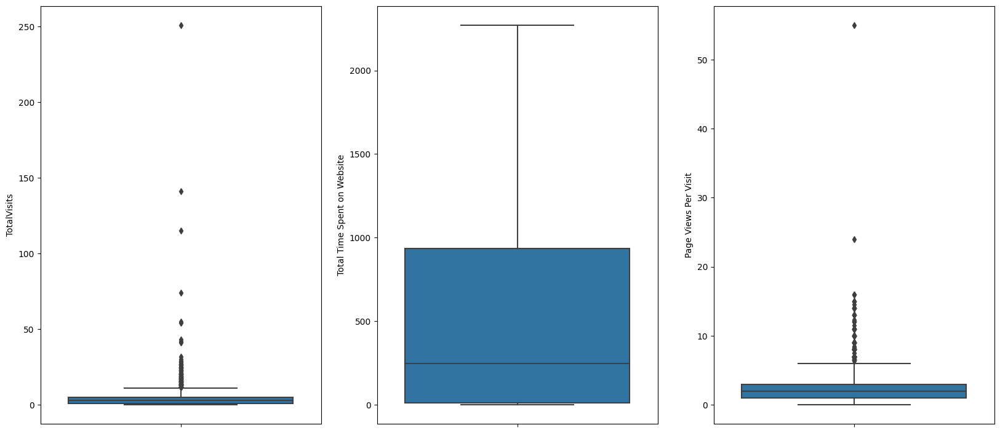

In [140]:
# Checking the outliers for all the numeric columns

plt.figure(figsize=(20, 30))
plt.subplot(3,3,1)
sns.boxplot(y = 'TotalVisits', data = df)
plt.subplot(3,3,2)
sns.boxplot(y = 'Total Time Spent on Website', data = df)
plt.subplot(3,3,3)
sns.boxplot(y = 'Page Views Per Visit', data = df)
plt.show()

We can see that outliers are present in the columns TotalVisits and Page Views Per Visit columns

In [141]:
# Removing values beyond 99% for Total Visits

total_visits = df['TotalVisits'].quantile(0.99)
df = df[df["TotalVisits"] < total_visits]
df["TotalVisits"].describe(percentiles=[.25,.5,.75,.90,.95,.99])

count    9141.000000
mean        3.179740
std         2.913631
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
90%         7.000000
95%         9.000000
99%        13.000000
max        16.000000
Name: TotalVisits, dtype: float64

In [142]:
# Removing values beyond 99% for page Views Per Visit

page_visits = df['Page Views Per Visit'].quantile(0.99)
df = df[df["Page Views Per Visit"] < page_visits]
df["Page Views Per Visit"].describe(percentiles=[.25,.5,.75,.90,.95,.99])

count    9029.000000
mean        2.226383
std         1.823395
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
90%         5.000000
95%         6.000000
99%         7.000000
max         8.000000
Name: Page Views Per Visit, dtype: float64

In [143]:
df.shape

(9029, 23)

In [145]:
# Checking data again at 25%,50%,75%,90%,95% and above after removing values at 99 percentile
df.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,A free copy of Mastering The Interview
count,9029.000000,9029.000000,9029.000000,9029.000000,9029.000000,9029.000000,9029.00000,9029.0,9029.0,9029.000000,9029.000000,9029.000000,9029.000000
mean,0.077749,0.000222,0.385092,3.087164,483.133016,2.226383,0.00144,0.0,0.0,0.000111,0.000222,0.000665,0.305682
std,0.267792,0.014882,0.486644,2.801244,547.420675,1.823395,0.03792,0.0,0.0,0.010524,0.014882,0.025771,0.460721
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,7.000000,1.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,3.000000,245.000000,2.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.000000,4.000000,929.000000,3.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,1.000000
90%,0.000000,0.000000,1.000000,7.000000,1378.000000,5.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,1.000000
95%,1.000000,0.000000,1.000000,8.000000,1558.000000,6.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,1.000000
99%,1.000000,0.000000,1.000000,13.000000,1839.720000,7.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,1.000000


observe that `['Do Not Call', 'Search', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement', 'Through Recommendations']` are so skewed to 'No' (0). 

Let's drop them as well

In [147]:
df.drop(['Do Not Call', 'Search', 'Newspaper Article', 
         'X Education Forums', 'Newspaper', 
         'Digital Advertisement', 'Through Recommendations'], 
         axis=1, inplace=True)

In [148]:
# Checking data again at 25%,50%,75%,90%,95% and above after removing values at 99 percentile
df.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview
count,9029.000000,9029.000000,9029.000000,9029.000000,9029.000000,9029.000000
mean,0.077749,0.385092,3.087164,483.133016,2.226383,0.305682
std,0.267792,0.486644,2.801244,547.420675,1.823395,0.460721
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,7.000000,1.000000,0.000000
50%,0.000000,0.000000,3.000000,245.000000,2.000000,0.000000
75%,0.000000,1.000000,4.000000,929.000000,3.000000,1.000000
90%,0.000000,1.000000,7.000000,1378.000000,5.000000,1.000000
95%,1.000000,1.000000,8.000000,1558.000000,6.000000,1.000000
99%,1.000000,1.000000,13.000000,1839.720000,7.000000,1.000000


In [150]:
# Finding the percentage of data retained

percent_data = round(100*(len(df) / 9240), 2)
print(percent_data)

97.72


Data has been cleaned and upto 97% of data has been retained.

On this cleaned data we will do the data analysis (EDA) & modeling

## 4. Visualising Data

In [151]:
# print information of columns, their dtypes
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9029 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9029 non-null   object 
 1   Lead Source                                    9029 non-null   object 
 2   Do Not Email                                   9029 non-null   int64  
 3   Converted                                      9029 non-null   int64  
 4   TotalVisits                                    9029 non-null   float64
 5   Total Time Spent on Website                    9029 non-null   int64  
 6   Page Views Per Visit                           9029 non-null   float64
 7   Last Activity                                  9029 non-null   object 
 8   Country                                        9029 non-null   object 
 9   Specialization                                 9029 

### Univariate Analysis - Numerical Variables

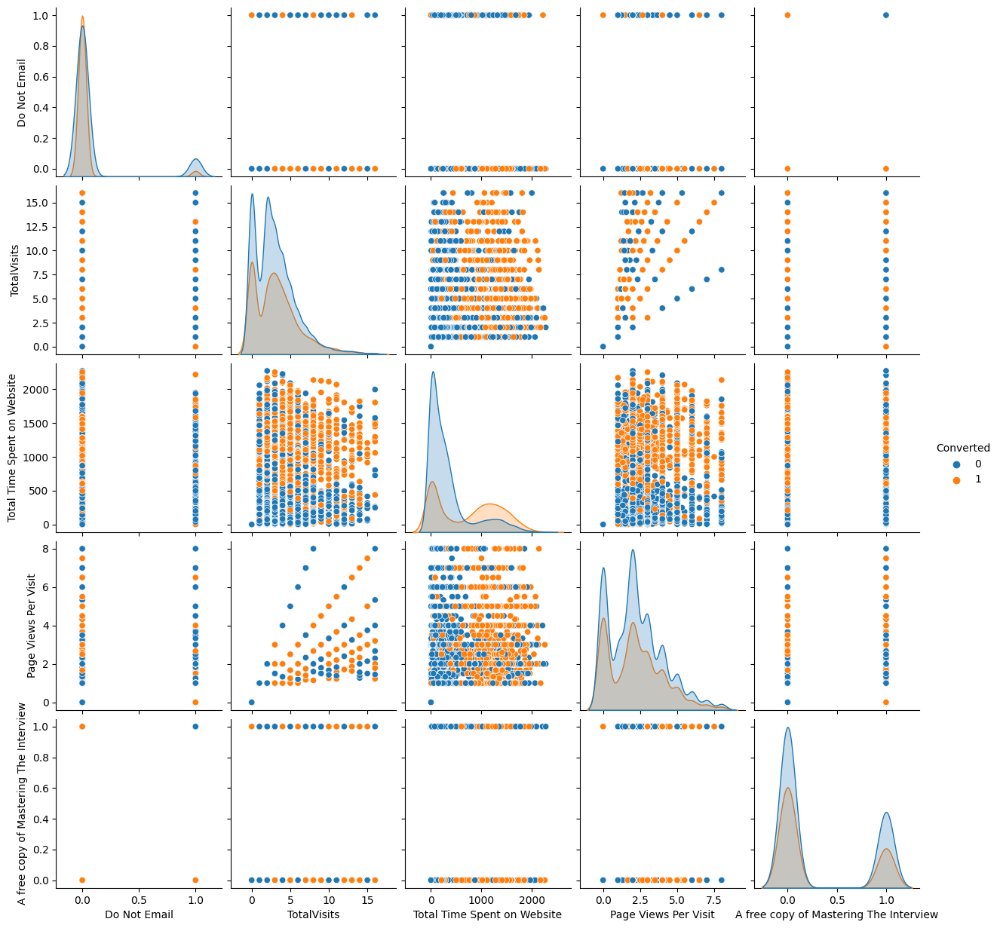

In [153]:
# Finding the relation between 
sns.pairplot(df, hue='Converted')

plt.grid()
plt.show()

We can observe from the pairplot above that some independent factors have a positive correlation with the variable labelled "Converted."

In [154]:
# compute pearson correlation coefficient
corr = df.corr()
corr

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview
Do Not Email,1.000000,-0.132879,-0.018485,-0.045955,0.016326,0.054237
Converted,-0.132879,1.000000,0.050210,0.359630,-0.005636,-0.040934
TotalVisits,-0.018485,0.050210,1.000000,0.353603,0.723836,0.276740
Total Time Spent on Website,-0.045955,0.359630,0.353603,1.000000,0.350819,0.168090
Page Views Per Visit,0.016326,-0.005636,0.723836,0.350819,1.000000,0.287694
A free copy of Mastering The Interview,0.054237,-0.040934,0.276740,0.168090,0.287694,1.000000


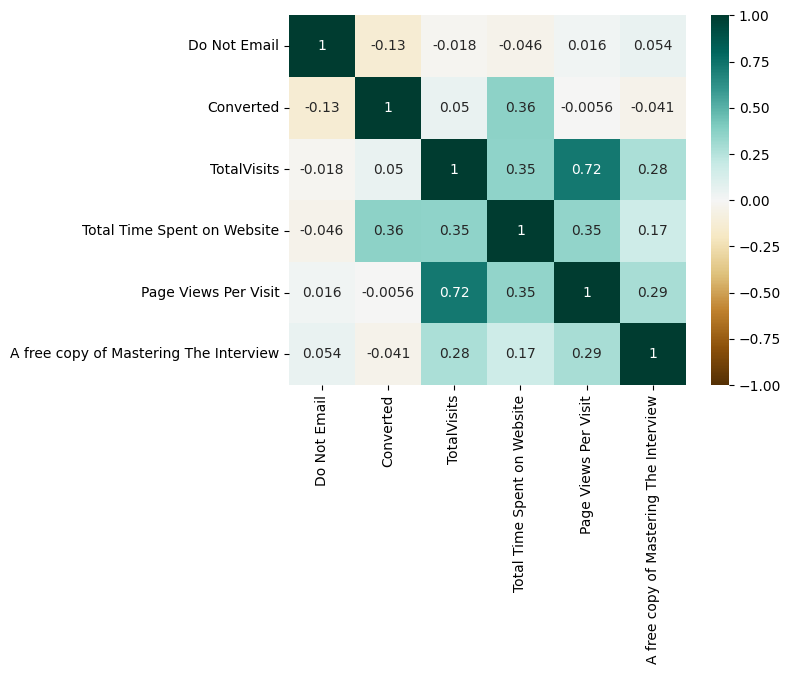

In [160]:
# Heatmap of correlations
sns.heatmap(corr, cmap="BrBG", annot=True, vmax=1, vmin=-1, center=0)
plt.show()

We can observe that `Total Visits` has high positive correlation with `Page Views per Visit` and few moderate strong positive correlations as shwon above.

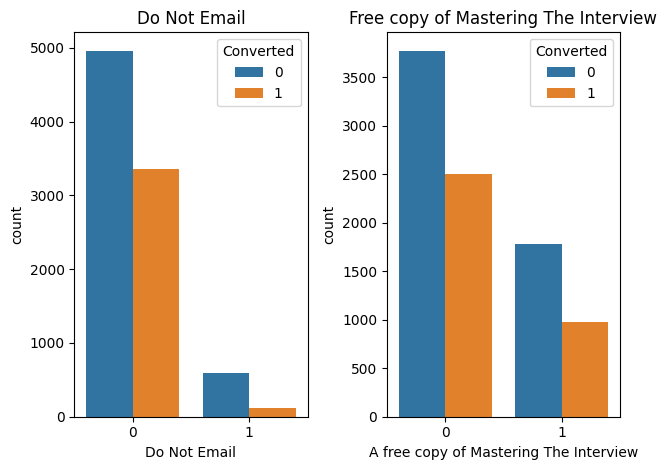

In [166]:
plt.subplot(1,2,1)
s1 = sns.countplot(data=df, x= 'Do Not Email', hue='Converted' )
plt.title("Do Not Email")

plt.subplot(1,2,2)
s2 = sns.countplot(data=df, x='A free copy of Mastering The Interview', hue='Converted')
plt.title("Free copy of Mastering The Interview")

plt.tight_layout()
plt.show()

We can boserve that:
- High conversions are seen among people who opted for email subscription than who didn't
- Comparably more conversions are seen among people who didn't wanted a free copy of "mastering the interview"

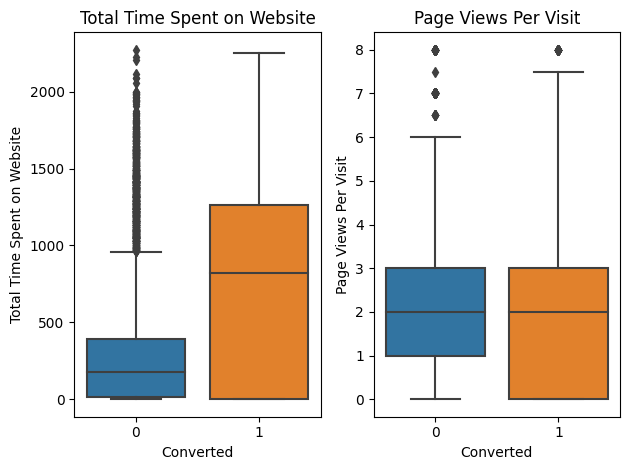

In [169]:
plt.subplot(1,2,1)
sns.boxplot(data=df, x="Converted" , y="Total Time Spent on Website")
plt.title("Total Time Spent on Website")

plt.subplot(1,2,2)
sns.boxplot(data=df, x="Converted", y="Page Views Per Visit")
plt.title("Page Views Per Visit")

plt.tight_layout()
plt.show()

We can boserve that:

- People who Converted have spent larger time on the website than others.

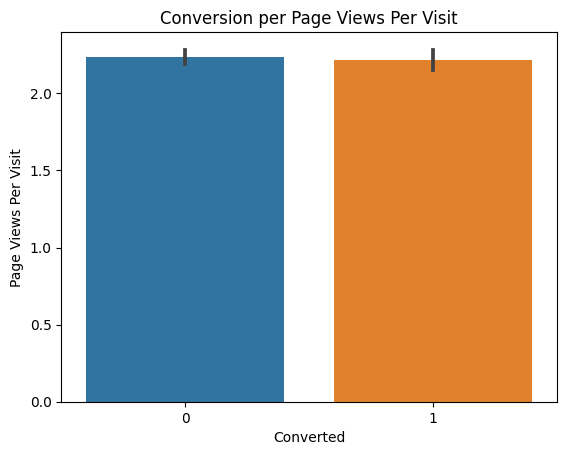

In [170]:
plt.title("Conversion per Page Views Per Visit")
sns.barplot(y = 'Page Views Per Visit', x='Converted', data = df)
plt.show()

We can boserve that no significant difference in the number of page views per visit among people who converted and who didn't

### Univariate Analysis - Categorical Variables

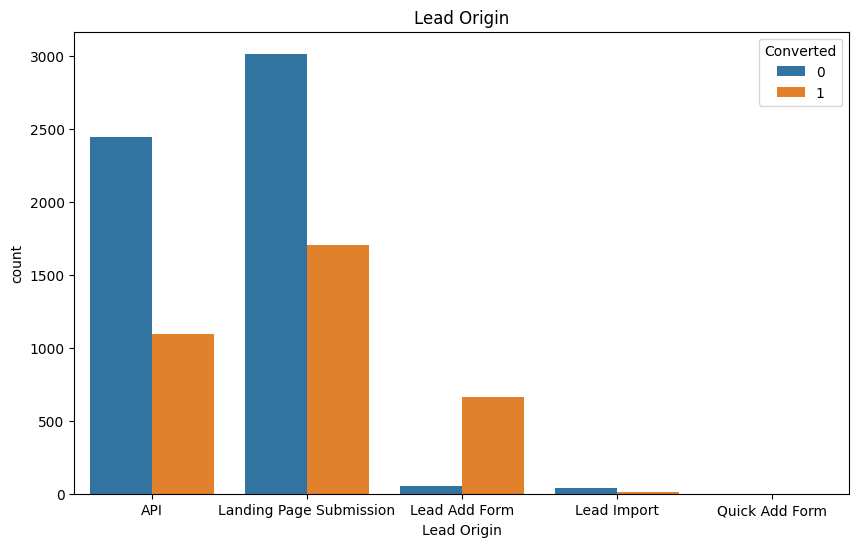

In [175]:
# plotting graphs of all the categorical columns:

plt.figure(figsize = (10,6))
sns.countplot(data=df, x='Lead Origin', hue = 'Converted')
plt.title('Lead Origin')

plt.show()

We can boserve that:
- Most of the Lead Origins have appeared with "Landing Page Submission" followed by "API" identifiers.
- The Conversion rate is higher with the identifier "Lead Add Form Lead Orign"

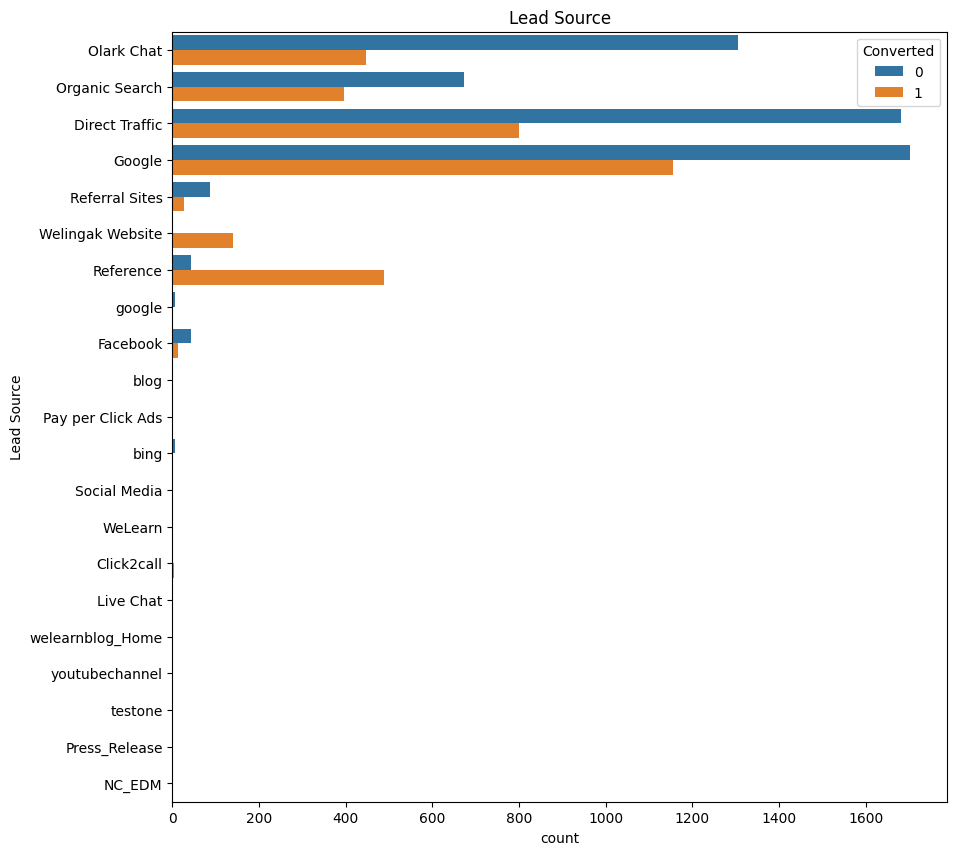

In [180]:
plt.figure(figsize = (10,10))

sns.countplot(data=df, y='Lead Source', hue ='Converted')
plt.title('Lead Source')
# plt.xticks(rotation = 45)

plt.show()


We can observe that:
- Most Lead Source are identified from "Google" follwed by "Direct Traffic", "Olark Chart"
- "Google" has highest conversion rate, follwed by "Direct Traffic", "Olark Chart"
- Most difference in Converted and non-Converted ones can be seen in "Reference" Lead source.


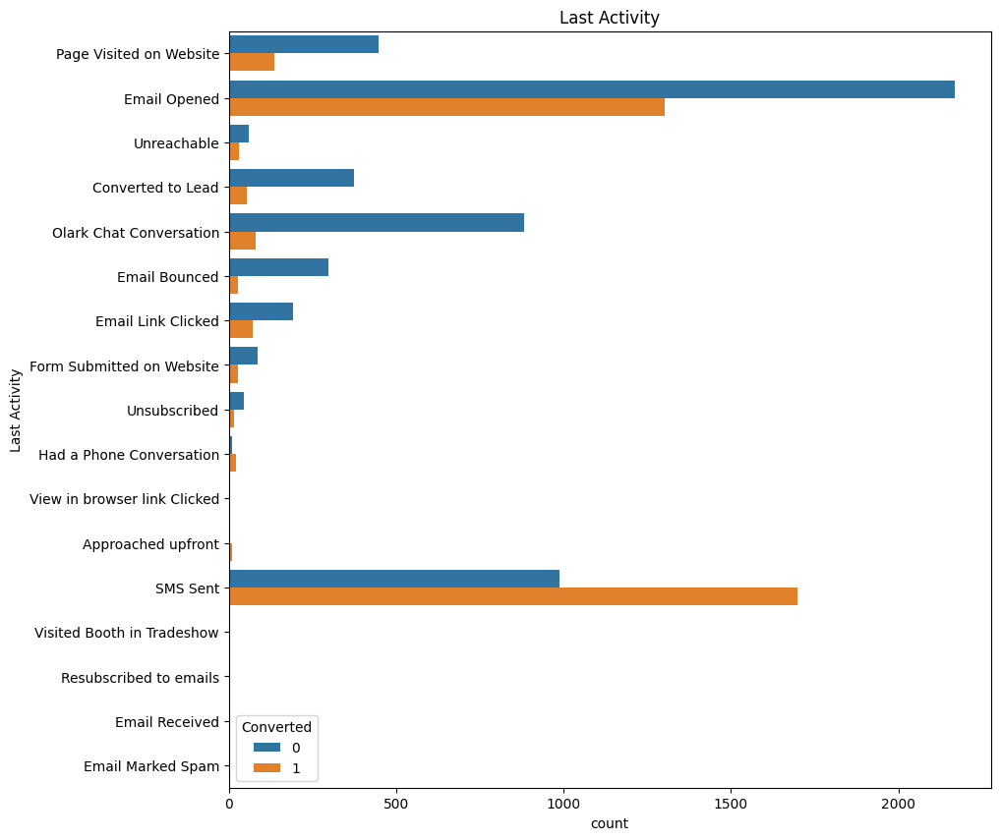

In [183]:
plt.figure(figsize = (10,10))

sns.countplot(data=df, y='Last Activity', hue ='Converted')
plt.title('Last Activity')


plt.show()

We can observe that:
- "Email Opened" and "SMS Sent" are the Most Last Activity of customers.
- Those whose Last Activity was SMS sent had the best conversion rate.

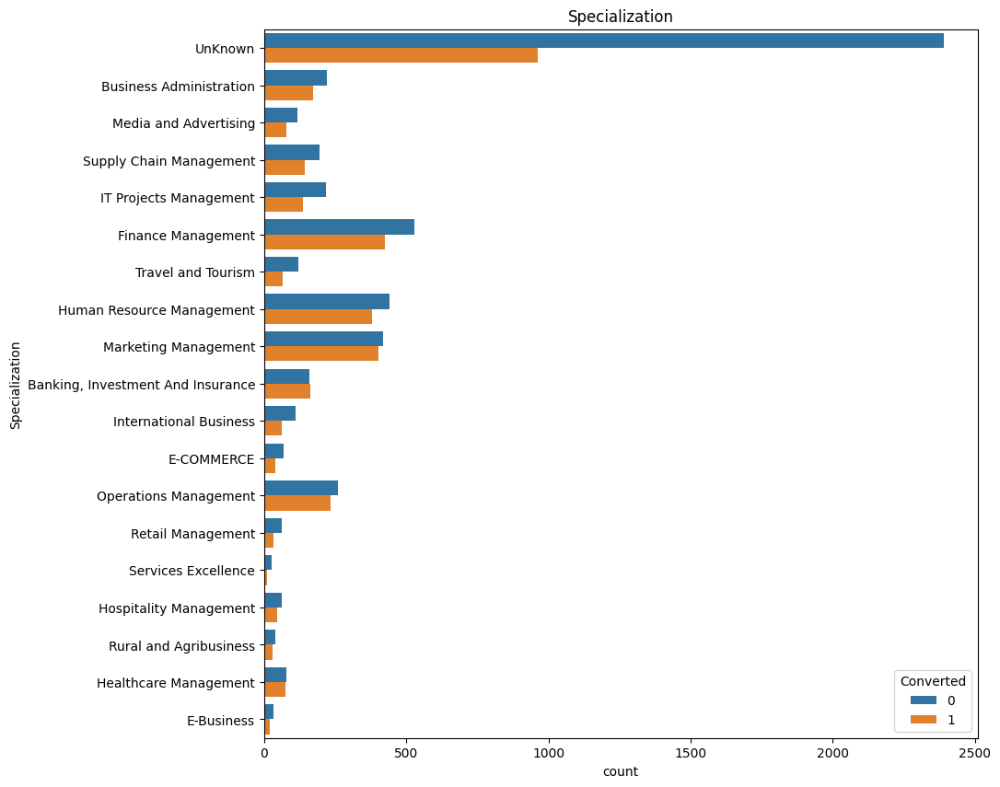

In [184]:
plt.figure(figsize = (10, 10))

sns.countplot(data= df, y='Specialization', hue ='Converted')
plt.title('Specialization')


plt.show()

We can observe that:
- Whose Specialization is unknown has the highest rate of conversion.
- Other than "Unknown"s high conversion is seen in "Finance Management", "human resource manaement", "Marketring management"

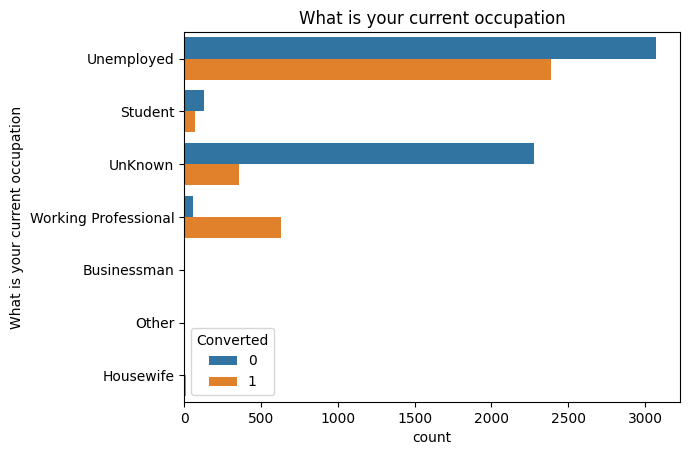

In [187]:
# plt.figure(figsize = (16,8))

sns.countplot(data=df,y='What is your current occupation', hue ='Converted')
plt.title('What is your current occupation')
plt.show()

We can observe that:
- Person who are unemployed has the highest conversion rate comparatively to working professional.
- Those whose occupation in "Unknown" has high number of non-conversions.
- Among "Working Professionals" very high conversion rate is seen.

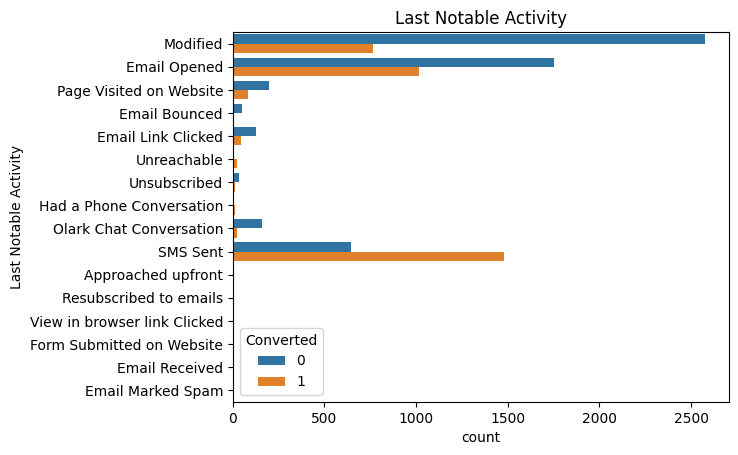

In [188]:
# plt.figure(figsize = (16,8))
# plt.subplots_adjust(hspace=0.2)

sns.countplot(data=df, y='Last Notable Activity', hue ='Converted')
plt.title('Last Notable Activity')

plt.show()

We can observe that:
- Those whose Last Notable Activity was found to be "SMS Sent" have the best conversion rate, followed by "Modifier", "Email Opened".

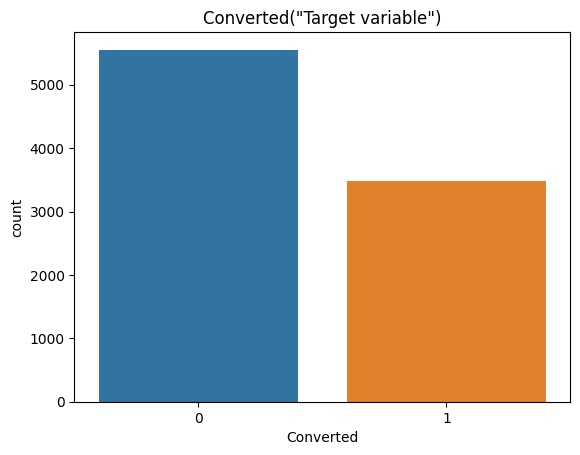

In [194]:
sns.countplot(data=df, x='Converted')
plt.title('Converted("Target variable")')
plt.show()

In [195]:
# Checking the percentage of conversion rate yes=1 no=0
df['Converted'].value_counts(normalize=True) * 100

0    61.490752
1    38.509248
Name: Converted, dtype: float64

From the dataset, can see that the convertion rate is 38.5%.

## 5. Creating Dummy Variables

In [196]:
# print dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9029 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Origin                                    9029 non-null   object 
 1   Lead Source                                    9029 non-null   object 
 2   Do Not Email                                   9029 non-null   int64  
 3   Converted                                      9029 non-null   int64  
 4   TotalVisits                                    9029 non-null   float64
 5   Total Time Spent on Website                    9029 non-null   int64  
 6   Page Views Per Visit                           9029 non-null   float64
 7   Last Activity                                  9029 non-null   object 
 8   Country                                        9029 non-null   object 
 9   Specialization                                 9029 

In [197]:
# print 5 sample records
df.sample(5)

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
765,API,Google,0,0,1.0,94,1.0,Converted to Lead,India,UnKnown,Unemployed,Better Career Prospects,Interested in other courses,UnKnown,0,Modified
1262,Landing Page Submission,Google,1,1,2.0,833,2.0,Email Bounced,India,Retail Management,Unemployed,Better Career Prospects,Not doing further education,Mumbai,0,Email Bounced
1396,Landing Page Submission,Google,0,1,2.0,861,2.0,SMS Sent,India,Finance Management,Student,Better Career Prospects,Still Thinking,Mumbai,0,SMS Sent
3587,Landing Page Submission,Google,0,0,3.0,47,3.0,Email Opened,India,"Banking, Investment And Insurance",Unemployed,Better Career Prospects,Ringing,Mumbai,0,Email Opened
2822,API,Olark Chat,0,0,0.0,0,0.0,Olark Chat Conversation,UnKnown,UnKnown,UnKnown,UnKnown,UnKnown,UnKnown,0,Modified


In [199]:
# identify categorical variables/features for dummy encoding
cat_cols = df.select_dtypes('object').columns
cat_cols

Index(['Lead Origin', 'Lead Source', 'Last Activity', 'Country',
       'Specialization', 'What is your current occupation',
       'What matters most to you in choosing a course', 'Tags', 'City',
       'Last Notable Activity'],
      dtype='object')

In [200]:
# Create dummy variables using the 'get_dummies'
dummy = pd.get_dummies(df[cat_cols], drop_first=True)
# Add the results to the master dataframe
df_dum = pd.concat([df, dummy], axis=1)
df_dum.drop(cat_cols, axis=1, inplace=True)
df_dum

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0,0.0,0,0.00,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,0,5.0,674,2.50,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1,2.0,1532,2.00,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1.0,305,1.00,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,1,2.0,1428,1.00,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9235,1,1,8.0,1845,2.67,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9236,0,0,2.0,238,2.00,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9237,1,0,2.0,199,2.00,1,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9238,0,1,3.0,499,3.00,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [201]:
# Since in Specialization we have certain null values as "Select" so using value_counts() finding the null values
df["Specialization"].value_counts()

UnKnown                              3352
Finance Management                    956
Marketing Management                  822
Human Resource Management             819
Operations Management                 495
Business Administration               392
IT Projects Management                357
Supply Chain Management               336
Banking, Investment And Insurance     322
Media and Advertising                 196
Travel and Tourism                    188
International Business                173
Healthcare Management                 152
Hospitality Management                108
E-COMMERCE                            107
Retail Management                      94
Rural and Agribusiness                 69
E-Business                             54
Services Excellence                    37
Name: Specialization, dtype: int64

In [202]:
df_dum.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9029 entries, 0 to 9239
Columns: 158 entries, Do Not Email to Last Notable Activity_View in browser link Clicked
dtypes: float64(2), int64(4), uint8(152)
memory usage: 2.0 MB


All are numerical features. Now our dataset is ready for building model

## Splitting the Data into Training and Testing Sets

In [203]:
# created X & y
y = df_dum['Converted']
X = df_dum.drop(['Converted'], axis = 1)

In [204]:
X.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0.0,0,0.0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,5.0,674,2.5,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,2.0,1532,2.0,1,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,1.0,305,1.0,0,1,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0
4,0,2.0,1428,1.0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [205]:
y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [213]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.75, test_size = 0.25, random_state = 42)

In [214]:
X_train.shape, y_train.shape

((6771, 157), (6771,))

In [215]:
X_test.shape, y_test.shape

((2258, 157), (2258,))

## Feature Scaling using Min Max Scaling

In [217]:
# Scaling the three numeric features present in the dataset
scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns) 
X_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0.0,0.5000,0.027515,0.5000,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.2500,0.187641,0.5000,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.1875,0.041949,0.1875,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.3125,0.344159,0.6250,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.1250,0.142986,0.2500,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


we could sepcifiy non-binary numerical columns only as well, but we can apply scaler on binary numerical features as well since it don't effect them.

In [219]:
# Checking the Conversion Rate
converted = (sum(df_dum['Converted'])/len(df_dum['Converted']))*100
converted

38.50924797873519

## Looking at Correlations

In [222]:
# compute pearson correlation on final dataframe after dummy encoding
corr_dum = df_dum.corr()
corr_dum

,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
Do Not Email,1.000000,-0.132879,-0.018485,-0.045955,0.016326,0.054237,0.092188,-0.019498,-0.017415,0.036248,...,-0.003056,-0.011025,0.118202,-0.012215,0.036091,-0.003056,-0.024659,-0.009972,0.246459,-0.003056
Converted,-0.132879,1.000000,0.050210,0.359630,-0.005636,-0.040934,-0.051533,0.325676,-0.023927,0.013299,...,-0.008329,0.041980,-0.245439,-0.074637,-0.035666,0.013299,0.355810,0.039152,-0.015071,-0.008329
TotalVisits,-0.018485,0.050210,1.000000,0.353603,0.723836,0.276740,0.434574,-0.253650,-0.045630,-0.000328,...,-0.004085,0.029059,-0.154464,-0.052855,0.187058,-0.011599,0.017771,0.013721,0.006104,0.018459
Total Time Spent on Website,-0.045955,0.359630,0.353603,1.000000,0.350819,0.168090,0.278164,-0.139136,-0.034720,0.033337,...,-0.003771,0.024900,-0.106815,-0.052725,0.025699,-0.009289,0.125829,0.010733,0.001878,-0.007578
Page Views Per Visit,0.016326,-0.005636,0.723836,0.350819,1.000000,0.287694,0.540923,-0.290488,-0.051877,-0.001307,...,-0.001307,0.017874,-0.119863,-0.094109,0.030100,-0.012851,0.066744,0.021176,0.018844,0.002561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Last Notable Activity_Resubscribed to emails,-0.003056,0.013299,-0.011599,-0.009289,-0.012851,-0.006983,-0.011005,-0.003091,-0.000824,-0.000111,...,-0.000111,-0.000400,-0.008072,-0.001510,-0.001886,1.000000,-0.005841,-0.000618,-0.000753,-0.000111
Last Notable Activity_SMS Sent,-0.024659,0.355810,0.017771,0.125829,0.066744,0.026133,0.056207,0.093815,-0.040091,-0.005841,...,-0.005841,-0.021073,-0.425628,-0.079598,-0.099463,-0.005841,1.000000,-0.032574,-0.039713,-0.005841
Last Notable Activity_Unreachable,-0.009972,0.039152,0.013721,0.010733,0.021176,0.002153,-0.000727,0.003769,-0.004595,-0.000618,...,-0.000618,-0.002229,-0.045017,-0.008419,-0.010520,-0.000618,-0.032574,1.000000,-0.004200,-0.000618
Last Notable Activity_Unsubscribed,0.246459,-0.015071,0.006104,0.001878,0.018844,0.020053,0.015489,-0.009510,-0.005602,-0.000753,...,-0.000753,-0.002717,-0.054883,-0.010264,-0.012825,-0.000753,-0.039713,-0.004200,1.000000,-0.000753


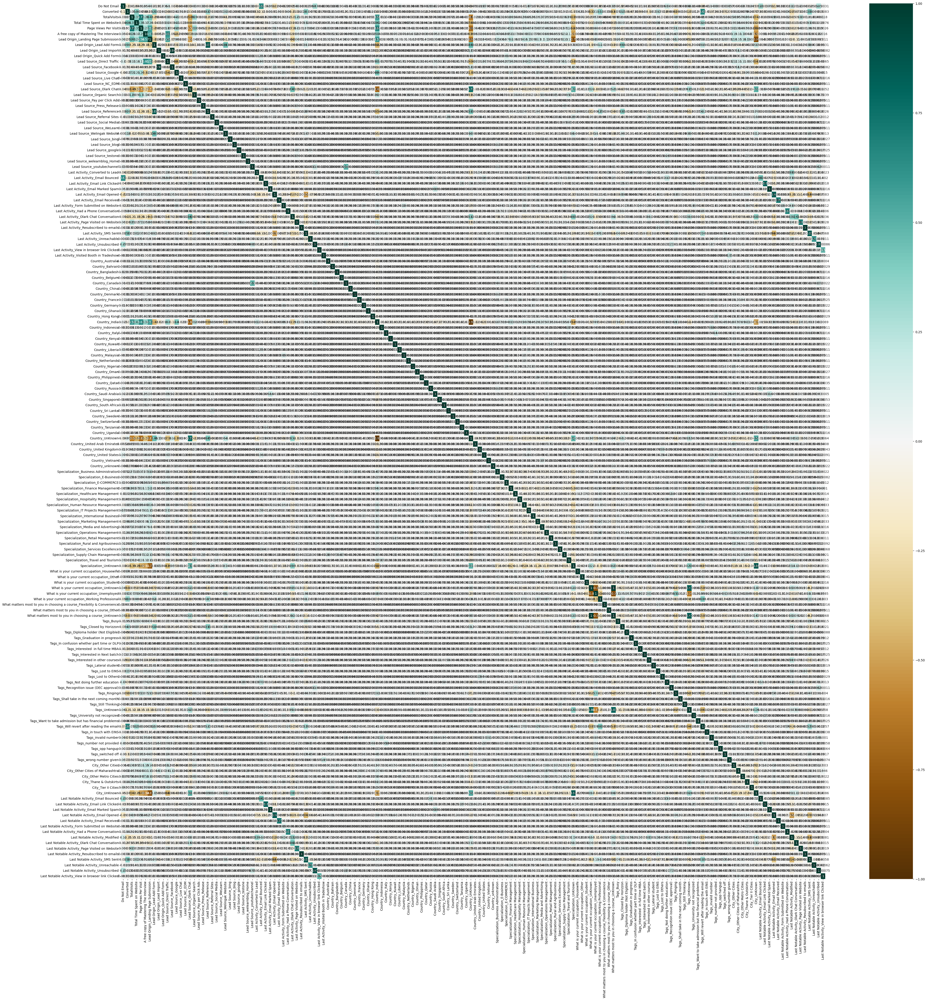

In [224]:
# Let's see the correlation matrix, Using heatmap for correlation
plt.figure(figsize = (50,50)) 
sns.heatmap(corr_dum, cmap="BrBG", annot=True, vmax=1, vmin=-1, center=0)
plt.show()

Due to the large number of features in the data set and the laborious nature of manually removing each feature one at a time, RFE is employed to do so. Starting with the 15 features that made the shortlist, the statsmodel library will be applied.

## Feature Selection Using RFE

In [225]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [226]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, n_features_to_select=15)             
rfe = rfe.fit(X_train, y_train)

In [227]:
rfe.support_

array([False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True,  True, False, False, False, False, False,
       False,  True,  True, False, False, False,  True, False, False,
        True, False,

In [230]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', False, 13),
 ('TotalVisits', False, 7),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 8),
 ('A free copy of Mastering The Interview', False, 55),
 ('Lead Origin_Landing Page Submission', False, 48),
 ('Lead Origin_Lead Add Form', False, 36),
 ('Lead Origin_Lead Import', False, 47),
 ('Lead Origin_Quick Add Form', False, 81),
 ('Lead Source_Direct Traffic', False, 77),
 ('Lead Source_Facebook', False, 12),
 ('Lead Source_Google', False, 116),
 ('Lead Source_Live Chat', False, 125),
 ('Lead Source_NC_EDM', False, 135),
 ('Lead Source_Olark Chat', False, 124),
 ('Lead Source_Organic Search', False, 88),
 ('Lead Source_Pay per Click Ads', False, 141),
 ('Lead Source_Press_Release', False, 140),
 ('Lead Source_Reference', False, 38),
 ('Lead Source_Referral Sites', False, 68),
 ('Lead Source_Social Media', False, 70),
 ('Lead Source_WeLearn', False, 133),
 ('Lead Source_Welingak Website', True, 1),
 ('Lead Source_bing', False, 73),
 ('Lead Sou

In [238]:
rank_df = pd.DataFrame(list(zip(X_train.columns, rfe.support_, rfe.ranking_)), columns=['Column', 'Support', 'Ranking']).sort_values('Ranking').reset_index(drop=True)
rank_df[:20]

,Column,Support,Ranking
0,Tags_Lateral student,True,1
1,Lead Source_Welingak Website,True,1
2,Tags_switched off,True,1
3,Tags_wrong number given,True,1
4,Tags_Will revert after reading the email,True,1
5,Last Activity_Email Bounced,True,1
6,Tags_UnKnown,True,1
7,Tags_Ringing,True,1
8,Tags_Lost to EINS,True,1
9,Tags_invalid number,True,1


In [236]:
# Attributes selected by RFE
col = X_train.columns[rfe.support_]
col

Index(['Total Time Spent on Website', 'Lead Source_Welingak Website',
       'Last Activity_Email Bounced',
       'What matters most to you in choosing a course_UnKnown', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lateral student', 'Tags_Lost to EINS',
       'Tags_Ringing', 'Tags_UnKnown',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

In [237]:
# Attributes rejected by RFE
X_train.columns[~rfe.support_]

Index(['Do Not Email', 'TotalVisits', 'Page Views Per Visit',
       'A free copy of Mastering The Interview',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Origin_Lead Import', 'Lead Origin_Quick Add Form',
       'Lead Source_Direct Traffic', 'Lead Source_Facebook',
       ...
       'Last Notable Activity_Email Received',
       'Last Notable Activity_Form Submitted on Website',
       'Last Notable Activity_Had a Phone Conversation',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_Page Visited on Website',
       'Last Notable Activity_Resubscribed to emails',
       'Last Notable Activity_Unreachable',
       'Last Notable Activity_Unsubscribed',
       'Last Notable Activity_View in browser link Clicked'],
      dtype='object', length=142)

You now have all the variables that RFE choose, and since we are interested in the statistical component, specifically P-values and VIF, Let's utilise Statsmodel to develop a Logistic Regression Model with these variables.

## 10. Model Building - Assessing the model with StatsModels

### Model 1

In [242]:
y_train = list(y_train)

In [243]:
# Fit a Logistic Regression Model on X-train after adding a constant and output the summary 

# Adding constant
X_train_sm = sm.add_constant(X_train[col])

# Running the model
logm1 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())

# Fit a line
res = logm1.fit()

# Checking the model summary
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6755
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1205.5
Date:                Fri, 14 Apr 2023   Deviance:                       2411.0
Time:                        23:55:07   Pearson chi2:                 9.17e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.6254
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                    -4.5849      0.208    -22.004      0.000      -4.993      -4.177
Total Time Spent on Website                               3.4538      0.221     15.628      0.000       3.021       3.887
Lead Source_Welingak Website                              3.4999      0.745      4.699      0.000       2.040       4.960
Last Activity_Email Bounced                              -1.9925      0.412     -4.839      0.000      -2.800      -1.186
What matters most to you in choosing a course_UnKnown    -2.7045      0.149    -18.192      0.000      -2.996      -2.413
Tags_Busy                                                 2.7373      0.301      9.084      0.000       2.147       3.328
Tags_Closed by Horizzon                                   8.8029      0.740     11.888      0.000       7.352      10.254
Tags_Lateral student                                     28.2997   7.14e+04      0.000      1.000    -1.4e+05     1.4e+05
Tags_Lost to EINS                                         8.4370      0.587     14.373      0.000       7.287       9.587
Tags_Ringing                                             -1.3437      0.293     -4.593      0.000      -1.917      -0.770
Tags_UnKnown                                              4.0641      0.229     17.753      0.000       3.615       4.513
Tags_Will revert after reading the email                  6.7171      0.252     26.607      0.000       6.222       7.212
Tags_invalid number                                     -21.8026   1.53e+04     -0.001      0.999   -3.01e+04       3e+04
Tags_switched off                                        -2.6101      0.754     -3.461      0.001      -4.088      -1.132
Tags_wrong number given                                 -22.0948   1.98e+04     -0.001      0.999   -3.89e+04    3.88e+04
Last Notable Activity_SMS Sent                            2.6439      0.136     19.390      0.000       2.377       2.911
=========================================================================================================================
"""

There are quite a 3 variables which have a p-value greater than 0.05 we need to care of them but first lets also calculate VIF

In [244]:
# Checking the VIF for the new model-
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Tags_UnKnown,5.28
3,What matters most to you in choosing a course_...,4.72
0,Total Time Spent on Website,1.84
10,Tags_Will revert after reading the email,1.73
14,Last Notable Activity_SMS Sent,1.61
1,Lead Source_Welingak Website,1.15
8,Tags_Ringing,1.15
5,Tags_Closed by Horizzon,1.08
7,Tags_Lost to EINS,1.07
4,Tags_Busy,1.06


In [245]:
# Removing the 'Tags_Lateral student' because it's P-value is also more than 0.05
col = col.drop('Tags_Lateral student',1)
col

Index(['Total Time Spent on Website', 'Lead Source_Welingak Website',
       'Last Activity_Email Bounced',
       'What matters most to you in choosing a course_UnKnown', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_UnKnown', 'Tags_Will revert after reading the email',
       'Tags_invalid number', 'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 2 

In [246]:
# Refit the model with the new set of features

# Adding constant
X_train_sm = sm.add_constant(X_train[col])

# Running the model
logm2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())

# Fit a line
res = logm2.fit()

# Checking the model summary
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6756
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1215.6
Date:                Fri, 14 Apr 2023   Deviance:                       2431.2
Time:                        23:59:49   Pearson chi2:                 9.19e+03
No. Iterations:                    23   Pseudo R-squ. (CS):             0.6243
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                    -4.4756      0.201    -22.319      0.000      -4.869      -4.083
Total Time Spent on Website                               3.4185      0.220     15.557      0.000       2.988       3.849
Lead Source_Welingak Website                              3.4950      0.745      4.693      0.000       2.035       4.955
Last Activity_Email Bounced                              -1.9904      0.410     -4.849      0.000      -2.795      -1.186
What matters most to you in choosing a course_UnKnown    -2.7012      0.148    -18.194      0.000      -2.992      -2.410
Tags_Busy                                                 2.6362      0.297      8.888      0.000       2.055       3.217
Tags_Closed by Horizzon                                   8.6974      0.738     11.779      0.000       7.250      10.145
Tags_Lost to EINS                                         8.3331      0.584     14.267      0.000       7.188       9.478
Tags_Ringing                                             -1.4442      0.288     -5.016      0.000      -2.009      -0.880
Tags_UnKnown                                              3.9599      0.222     17.819      0.000       3.524       4.395
Tags_Will revert after reading the email                  6.6131      0.246     26.843      0.000       6.130       7.096
Tags_invalid number                                     -21.9059   1.53e+04     -0.001      0.999   -3.01e+04       3e+04
Tags_switched off                                        -2.7101      0.752     -3.603      0.000      -4.184      -1.236
Tags_wrong number given                                 -22.1949   1.98e+04     -0.001      0.999   -3.89e+04    3.88e+04
Last Notable Activity_SMS Sent                            2.6480      0.136     19.469      0.000       2.381       2.915
=========================================================================================================================
"""

In [247]:
# Checking the VIF for the new model-
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Tags_UnKnown,5.28
3,What matters most to you in choosing a course_...,4.72
0,Total Time Spent on Website,1.84
9,Tags_Will revert after reading the email,1.73
13,Last Notable Activity_SMS Sent,1.61
1,Lead Source_Welingak Website,1.15
7,Tags_Ringing,1.15
5,Tags_Closed by Horizzon,1.08
6,Tags_Lost to EINS,1.07
4,Tags_Busy,1.06


In [248]:
# Removing the 'Tags_invalid number' because of it's high P-value
col = col.drop('Tags_invalid number',1)
col

Index(['Total Time Spent on Website', 'Lead Source_Welingak Website',
       'Last Activity_Email Bounced',
       'What matters most to you in choosing a course_UnKnown', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_UnKnown', 'Tags_Will revert after reading the email',
       'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 3 

In [249]:
# Refit the model with the new set of features

# Adding constant
X_train_sm = sm.add_constant(X_train[col])

# Running the model
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

# Fit a line
res = logm3.fit()

# Checking the model summary
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6757
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1219.7
Date:                Sat, 15 Apr 2023   Deviance:                       2439.4
Time:                        00:00:20   Pearson chi2:                 9.18e+03
No. Iterations:                    22   Pseudo R-squ. (CS):             0.6238
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                    -4.5938      0.200    -22.919      0.000      -4.987      -4.201
Total Time Spent on Website                               3.4395      0.220     15.663      0.000       3.009       3.870
Lead Source_Welingak Website                              3.4970      0.745      4.696      0.000       2.037       4.957
Last Activity_Email Bounced                              -1.9983      0.411     -4.866      0.000      -2.803      -1.193
What matters most to you in choosing a course_UnKnown    -2.6982      0.148    -18.204      0.000      -2.989      -2.408
Tags_Busy                                                 2.7631      0.295      9.373      0.000       2.185       3.341
Tags_Closed by Horizzon                                   8.8137      0.738     11.936      0.000       7.366      10.261
Tags_Lost to EINS                                         8.4447      0.584     14.452      0.000       7.299       9.590
Tags_Ringing                                             -1.3042      0.285     -4.579      0.000      -1.862      -0.746
Tags_UnKnown                                              4.0798      0.222     18.403      0.000       3.645       4.514
Tags_Will revert after reading the email                  6.7309      0.246     27.343      0.000       6.248       7.213
Tags_switched off                                        -2.5681      0.751     -3.420      0.001      -4.040      -1.096
Tags_wrong number given                                 -21.0561    1.2e+04     -0.002      0.999   -2.36e+04    2.36e+04
Last Notable Activity_SMS Sent                            2.6126      0.134     19.460      0.000       2.349       2.876
=========================================================================================================================
"""

In [250]:
# Checking the VIF for the new model-
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Tags_UnKnown,5.27
3,What matters most to you in choosing a course_...,4.72
0,Total Time Spent on Website,1.84
9,Tags_Will revert after reading the email,1.73
12,Last Notable Activity_SMS Sent,1.61
1,Lead Source_Welingak Website,1.15
7,Tags_Ringing,1.15
5,Tags_Closed by Horizzon,1.08
6,Tags_Lost to EINS,1.07
4,Tags_Busy,1.06


In [251]:
# Removing the 'Tags_wrong number given' because of it's high p-value
col = col.drop('Tags_wrong number given',1)
col

Index(['Total Time Spent on Website', 'Lead Source_Welingak Website',
       'Last Activity_Email Bounced',
       'What matters most to you in choosing a course_UnKnown', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_UnKnown', 'Tags_Will revert after reading the email',
       'Tags_switched off', 'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 4 

In [252]:
# Refit the model with the new set of features

# Adding constant
X_train_sm = sm.add_constant(X_train[col])

# Running the model
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

# Fit a line
res = logm4.fit()

# Checking the model summary
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6758
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1222.5
Date:                Sat, 15 Apr 2023   Deviance:                       2445.0
Time:                        00:01:09   Pearson chi2:                 9.16e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.6235
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                    -4.6657      0.201    -23.199      0.000      -5.060      -4.272
Total Time Spent on Website                               3.4412      0.219     15.684      0.000       3.011       3.871
Lead Source_Welingak Website                              3.4966      0.745      4.696      0.000       2.037       4.956
Last Activity_Email Bounced                              -2.0017      0.411     -4.875      0.000      -2.806      -1.197
What matters most to you in choosing a course_UnKnown    -2.6949      0.148    -18.212      0.000      -2.985      -2.405
Tags_Busy                                                 2.8441      0.294      9.675      0.000       2.268       3.420
Tags_Closed by Horizzon                                   8.8857      0.739     12.030      0.000       7.438      10.333
Tags_Lost to EINS                                         8.5140      0.585     14.564      0.000       7.368       9.660
Tags_Ringing                                             -1.2140      0.283     -4.287      0.000      -1.769      -0.659
Tags_UnKnown                                              4.1547      0.222     18.727      0.000       3.720       4.589
Tags_Will revert after reading the email                  6.8044      0.246     27.605      0.000       6.321       7.288
Tags_switched off                                        -2.4764      0.750     -3.301      0.001      -3.947      -1.006
Last Notable Activity_SMS Sent                            2.5896      0.133     19.430      0.000       2.328       2.851
=========================================================================================================================
"""

In [253]:
# Checking the VIF for the new model-
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Tags_UnKnown,5.27
3,What matters most to you in choosing a course_...,4.72
0,Total Time Spent on Website,1.83
9,Tags_Will revert after reading the email,1.72
11,Last Notable Activity_SMS Sent,1.60
1,Lead Source_Welingak Website,1.15
7,Tags_Ringing,1.15
5,Tags_Closed by Horizzon,1.08
6,Tags_Lost to EINS,1.07
4,Tags_Busy,1.06


In [254]:
# Removing the 'Tags_UnKnown' because of it's high VIF
col = col.drop('Tags_UnKnown',1)
col

Index(['Total Time Spent on Website', 'Lead Source_Welingak Website',
       'Last Activity_Email Bounced',
       'What matters most to you in choosing a course_UnKnown', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_switched off',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 5 

In [255]:
# Refit the model with the new set of features

# Adding constant
X_train_sm = sm.add_constant(X_train[col])

# Running the model
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

# Fit a line
res = logm5.fit()

# Checking the model summary
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6759
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1489.8
Date:                Sat, 15 Apr 2023   Deviance:                       2979.6
Time:                        00:01:42   Pearson chi2:                 9.46e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5926
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                    -2.5206      0.093    -27.097      0.000      -2.703      -2.338
Total Time Spent on Website                               3.0722      0.192     15.967      0.000       2.695       3.449
Lead Source_Welingak Website                              5.4522      0.737      7.401      0.000       4.008       6.896
Last Activity_Email Bounced                              -1.6763      0.403     -4.160      0.000      -2.466      -0.886
What matters most to you in choosing a course_UnKnown    -0.6779      0.111     -6.127      0.000      -0.895      -0.461
Tags_Busy                                                 0.7109      0.247      2.875      0.004       0.226       1.196
Tags_Closed by Horizzon                                   6.7644      0.717      9.439      0.000       5.360       8.169
Tags_Lost to EINS                                         5.2938      0.519     10.203      0.000       4.277       6.311
Tags_Ringing                                             -3.4247      0.232    -14.784      0.000      -3.879      -2.971
Tags_Will revert after reading the email                  4.6936      0.176     26.618      0.000       4.348       5.039
Tags_switched off                                        -4.6942      0.731     -6.422      0.000      -6.127      -3.262
Last Notable Activity_SMS Sent                            2.8158      0.119     23.742      0.000       2.583       3.048
=========================================================================================================================
"""

In [256]:
# Checking the VIF for the new model-
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Total Time Spent on Website,1.75
8,Tags_Will revert after reading the email,1.65
10,Last Notable Activity_SMS Sent,1.52
3,What matters most to you in choosing a course_...,1.15
7,Tags_Ringing,1.13
5,Tags_Closed by Horizzon,1.07
4,Tags_Busy,1.05
9,Tags_switched off,1.04
1,Lead Source_Welingak Website,1.03
2,Last Activity_Email Bounced,1.03


Now that we have our model, we can see.

The importance of the variables is indicated by their coefficient values, and their association with one another is shown by their VIF values.


Both the VIFs and the p-values fall within a reasonable range. Therefore, we proceed to make our forecasts solely based on this model.

## Creating Prediction

In this case study, the logistic regression curve gives us the probabilities of 'conversion' and 'non-conversion'. 
We can get these probabilities by simply using the 'predict' function.

In [257]:
# Predicting the probabilities (of the "converted" value being 1) on the train set
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [258]:
y_train_pred[:10]

array([4.25317347e-02, 1.25191506e-01, 8.36115206e-04, 6.62516023e-01,
       4.04574896e-03, 3.92195184e-02, 3.92195184e-02, 7.44250366e-02,
       9.95523574e-01, 2.55603632e-01])

In [268]:
#Creating a dataframe with the actual converted flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Converted':y_train, 'Converted_Prob':y_train_pred})
y_train_pred_final['LeadId'] = list(X_train.index)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId
0,0,0.042532,0
1,0,0.125192,1
2,0,0.000836,2
3,1,0.662516,3
4,0,0.004046,4


In [269]:
#Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId,predicted
0,0,0.042532,0,0
1,0,0.125192,1,0
2,0,0.000836,2,0
3,1,0.662516,3,1
4,0,0.004046,4,0


We can see that the values in the 'Predicted' column remain '0' when the corresponding values in the 'Conversion_Prob' column are below 0.5. As soon as the value in the 'Conversion Prob' becomes greater than 0.5, the correspondingvalue in the 'Predicted' column becomes '1'.

## Model Evaluation

In [270]:
# Checking the accuracy with cut-off being 0.5
# Checking the confusion metrics and accuracy

confusion = confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted )
print(confusion)

[[3969  158]
 [ 360 2284]]


In [271]:
# checking the overall accuracy
print(accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.9234972677595629


Accuracy rate for the model is a decent 92.2%, but we can't rely only on Accuracy. We also need to use other metrics.

Metrics - Sensitivity, Specificity, False Positive Rate, Postitive Predictive Value and Negative Predictive Value

In [272]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [273]:
# Checking the sensitivity of our logistic regression model

TP / float(TP+FN)

0.8638426626323752

In [274]:
# Let us calculate specificity

TN / float(TN+FP)

0.961715531863339

In [275]:
# Calculate false postive rate - predicting non conversion when leads have converted

print(FP/ float(TN+FP))

0.03828446813666101


In [276]:
# positive predictive value 

print (TP / float(TP+FP))

0.9352989352989353


In [277]:
# Negative predictive value

print (TN / float(TN+ FN))

0.9168399168399168


Our model seems to have high accuracy (92.2%), low sensitivity (86.3%) and high specificity (96.4%).
Since we're interested in identifying the customers which might convert, we clearly need to deal with this.
We will deal with this situation with the help of ROC Curves in the next section.

## 13. Plotting the ROC Curve ('Receiver Operating Characteristic' Curve)

In [278]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None

TPR = True Positive Rate --> Out of actually 'converted' cases, how many is the model correctly predicting as 'converted'

FPR = False Positive Rate --> Out of actual 'non-convert' cases, how many is the model incorrectly predicting as 'converted'

Thus we would want as high TPR as possible & as low FPR as possible. Ideal model would have TPR = 1 and FPR = 0.

ROC Curve shows the trade-off between TPR and FPR.

In [279]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, 
                                         y_train_pred_final.Converted_Prob, 
                                         drop_intermediate = False )

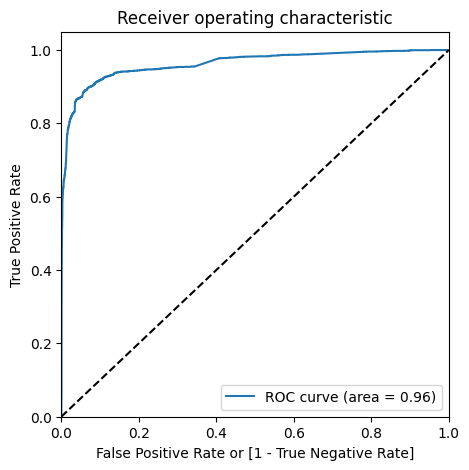

In [280]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

The ROC's 0.96 is a great value. So it appears that we have a good model. To determine the best cutoff point, let's additionally examine the tradeoff between sensitivity and specificity.

## Finding Optimal Cutoff Point

### Sensitivity and Specificity

In [281]:
# create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.042532,0,0,1,0,0,0,0,0,0,0,0,0
1,0,0.125192,1,0,1,1,0,0,0,0,0,0,0,0
2,0,0.000836,2,0,1,0,0,0,0,0,0,0,0,0
3,1,0.662516,3,1,1,1,1,1,1,1,1,0,0,0
4,0,0.004046,4,0,1,0,0,0,0,0,0,0,0,0


In [282]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.

cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.390489  1.000000  0.000000
0.1   0.1  0.841825  0.947050  0.774412
0.2   0.2  0.903707  0.922466  0.891689
0.3   0.3  0.915817  0.900151  0.925854
0.4   0.4  0.920396  0.885023  0.943058
0.5   0.5  0.923497  0.863843  0.961716
0.6   0.6  0.914341  0.830182  0.968258
0.7   0.7  0.912864  0.815809  0.975042
0.8   0.8  0.906070  0.788578  0.981342
0.9   0.9  0.874317  0.697428  0.987642


In [283]:
cutoff_df

,prob,accuracy,sensi,speci
0.0,0.0,0.390489,1.000000,0.000000
0.1,0.1,0.841825,0.947050,0.774412
0.2,0.2,0.903707,0.922466,0.891689
0.3,0.3,0.915817,0.900151,0.925854
0.4,0.4,0.920396,0.885023,0.943058
0.5,0.5,0.923497,0.863843,0.961716
0.6,0.6,0.914341,0.830182,0.968258
0.7,0.7,0.912864,0.815809,0.975042
0.8,0.8,0.906070,0.788578,0.981342
0.9,0.9,0.874317,0.697428,0.987642


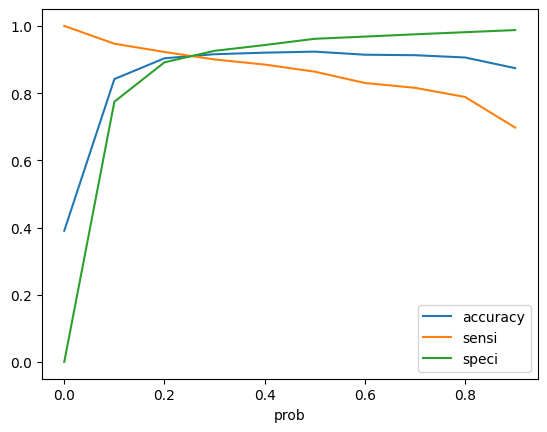

In [284]:
# Let's plot accuracy sensitivity and specificity for various probabilities.

cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

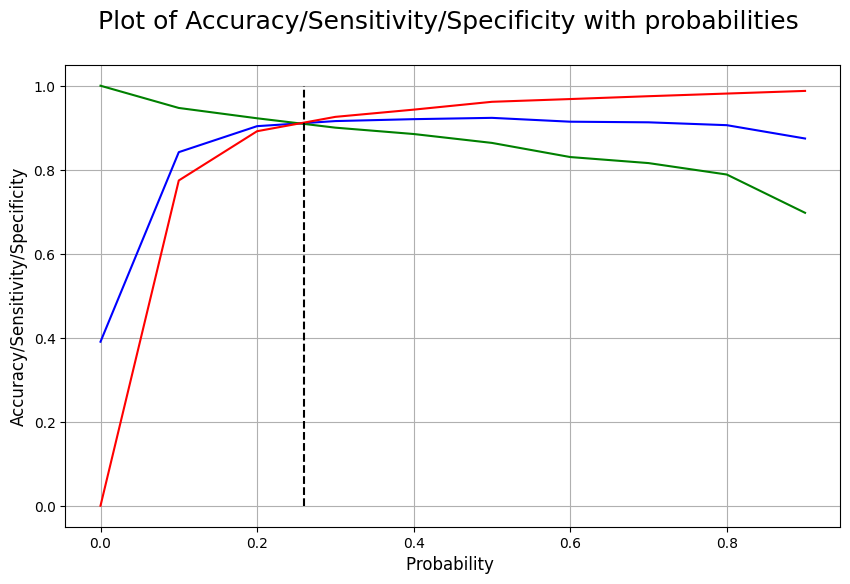

In [292]:
# Let's plot accuracy sensitivity and specificity for various probabilities.

plt.figure(figsize = (10,6))

sns.lineplot(x=cutoff_df.prob , y=cutoff_df.accuracy , color = "blue")
sns.lineplot(x=cutoff_df.prob , y=cutoff_df.sensi , color = "green")
sns.lineplot(x=cutoff_df.prob , y=cutoff_df.speci , color = "red")
plt.plot([0.26, 0.26], [0, 1], 'k--')


plt.title("Plot of Accuracy/Sensitivity/Specificity with probabilities \n", fontdict={'fontsize': 18, 'fontweight' : 18})


plt.xlabel("Probability ", fontdict={'fontsize': 12, 'fontweight' : 18})
plt.ylabel("Accuracy/Sensitivity/Specificity", fontdict={'fontsize': 12, 'fontweight' : 18})

plt.grid()
plt.show()

We can observe that around 0.26 we see the optimal values of three metrics so lets choose it as our cutoff threshold.

In [293]:
prob_thresh = 0.26

In [294]:
y_train_pred_final['final_Predicted']=y_train_pred_final.Converted_Prob.map(lambda x: 1 if x>prob_thresh else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,LeadId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_Predicted
0,0,0.042532,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.125192,1,0,1,1,0,0,0,0,0,0,0,0,0
2,0,0.000836,2,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.662516,3,1,1,1,1,1,1,1,1,0,0,0,1
4,0,0.004046,4,0,1,0,0,0,0,0,0,0,0,0,0


In [295]:
# Now let us calculate the lead score

y_train_pred_final['lead_score_board'] = y_train_pred_final.Converted_Prob.map(lambda x: round(x*100))
y_train_pred_final.head(20)

,Converted,Converted_Prob,LeadId,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_Predicted,lead_score_board
0,0,0.042532,0,0,1,0,0,0,0,0,0,0,0,0,0,4
1,0,0.125192,1,0,1,1,0,0,0,0,0,0,0,0,0,13
2,0,0.000836,2,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0.662516,3,1,1,1,1,1,1,1,1,0,0,0,1,66
4,0,0.004046,4,0,1,0,0,0,0,0,0,0,0,0,0,0
5,0,0.039220,5,0,1,0,0,0,0,0,0,0,0,0,0,4
6,0,0.039220,6,0,1,0,0,0,0,0,0,0,0,0,0,4
7,0,0.074425,7,0,1,0,0,0,0,0,0,0,0,0,0,7
8,1,0.995524,8,1,1,1,1,1,1,1,1,1,1,1,1,100
9,0,0.255604,9,0,1,1,1,0,0,0,0,0,0,0,0,26


In [296]:
# Checking if 75% cases are correctly predicted based on the converted column.
# Get the total of final predicted conversion / non conversion counts from the actual converted rates

checking_df = y_train_pred_final.loc[y_train_pred_final['Converted']==1,['Converted','final_Predicted']]
checking_df['final_Predicted'].value_counts()

1    2395
0     249
Name: final_Predicted, dtype: int64

In [298]:
sum(checking_df['final_Predicted'])/len(checking_df)

0.9058245083207261

In [299]:
#Lets check  accuracy
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_Predicted))

0.9118298626495348


In [300]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_Predicted )
confusion2

array([[3779,  348],
       [ 249, 2395]])

In [301]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [302]:
# The Sensitivity of our logistic regression model

TP / float(TP+FN)

0.9058245083207261

In [303]:
# Let us calculate specificity

TN / float(TN+FP)

0.9156772473952023

In [304]:
# Calculate false postive rate - predicting conversion when customer has not have converted
print(FP/ float(TN+FP))

0.08432275260479767


In [305]:
# Positive predictive value 
print (TP / float(TP+FP))

0.8731316077287641


In [306]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9381827209533267


Accuracy = 0.91

Sensitivity = 0.91

Specificity = 0.92

### Precision and Recall

In [307]:
#Looking at the confusion matrix again
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_Predicted)
confusion

array([[3779,  348],
       [ 249, 2395]])

In [308]:
# Precision = TP/ (TP + FP)
# Probability that a predicted 'Yes' is actually a 'Yes'.

# Precision:
TP/ (TP + FP)

0.8731316077287641

In [309]:
# Alternately, Precision:
confusion[1,1]/(confusion[0,1] + confusion[1,1])

0.8731316077287641

In [310]:
# Recall = TP/ (TP + FN)
# Probability that an actual 'Yes' case is predicted correctly.

# Recall:
TP/ (TP + FN)

0.9058245083207261

In [311]:
# Alternately, Recall:
confusion[1,1]/(confusion[1,0] + confusion[1,1])

0.9058245083207261

In [312]:
# Using sklearn utilities for the same

precision_score(y_train_pred_final.Converted, y_train_pred_final.final_Predicted)

0.8731316077287641

In [313]:
recall_score(y_train_pred_final.Converted, y_train_pred_final.final_Predicted)

0.9058245083207261

### Precision and recall tradeoff

In [314]:
y_train_pred_final.Converted, y_train_pred_final.final_Predicted

(0       0
 1       0
 2       0
 3       1
 4       0
        ..
 6766    1
 6767    1
 6768    0
 6769    0
 6770    0
 Name: Converted, Length: 6771, dtype: int64,
 0       0
 1       0
 2       0
 3       1
 4       0
        ..
 6766    1
 6767    1
 6768    0
 6769    0
 6770    0
 Name: final_Predicted, Length: 6771, dtype: int64)

In [315]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

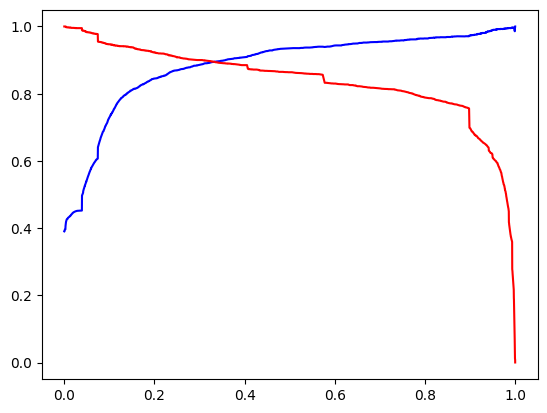

In [316]:
plt.plot(thresholds, p[:-1], "b-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

As per the above graph, the cut-off value is approximately 0.26

## Making predictions on the test set

Finally, since we've chosen the optimal scenario based on the evaluation metrics, we'll finally go on and 
make predictions on the test data set and see how our model performs there as well.
In this session, we will go forward with the sensitivity-specificity view of things and make predictions
based on the 0.40 cut-off that we decided earlier.

In [318]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [319]:
X_test = X_test[col]
X_test.head()

,Total Time Spent on Website,Lead Source_Welingak Website,Last Activity_Email Bounced,What matters most to you in choosing a course_UnKnown,Tags_Busy,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_SMS Sent
0,0.665313,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,0.184032,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.163284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.407307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.744700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [320]:
#Add constant to X_test
X_test_sm = sm.add_constant(X_test)

In [321]:
#Check X_test_sm
X_test_sm

,const,Total Time Spent on Website,Lead Source_Welingak Website,Last Activity_Email Bounced,What matters most to you in choosing a course_UnKnown,Tags_Busy,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_SMS Sent
0,1.0,0.665313,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
1,1.0,0.184032,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,1.0,0.163284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.407307,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.744700,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2253,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2254,1.0,0.181326,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2255,1.0,0.248083,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2256,1.0,0.130356,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [322]:
# Making predictions on the test set
y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

0    0.999118
1    0.071482
2    0.117224
3    0.968454
4    0.999309
5    0.405456
6    0.023441
7    0.039220
8    0.513511
9    0.941210
dtype: float64

In [323]:
# Converting y_pred to a dataframe which is an array
y_test_pred = pd.DataFrame(y_test_pred)
y_test_pred.head()

,0
0,0.999118
1,0.071482
2,0.117224
3,0.968454
4,0.999309


In [324]:
# Converting y_test to dataframe
y_test_dataframe = pd.DataFrame(y_test)

In [325]:
# add lead ids
y_test_dataframe['Lead ID'] = y_test_dataframe.index

In [326]:
# Removing index for both dataframes to append them side by side 
y_test_pred.reset_index(drop=True, inplace=True)
y_test_dataframe.reset_index(drop=True, inplace=True)

In [327]:
# Appending y_test_dataframe and y_test_pred
y_pred_final = pd.concat([y_test_dataframe, y_test_pred],axis=1)

In [328]:
# Checking the head() of the final dataframe
y_pred_final.head()

,Converted,Lead ID,0
0,1,2296,0.999118
1,0,8697,0.071482
2,0,7378,0.117224
3,0,8631,0.968454
4,1,4799,0.999309


In [329]:
# Renaming the column 

y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

In [330]:
y_pred_final['Lead_Score_Board'] = y_pred_final.Converted_Prob.map(lambda x: round(x*100))
y_pred_final.head()

,Converted,Lead ID,Converted_Prob,Lead_Score_Board
0,1,2296,0.999118,100
1,0,8697,0.071482,7
2,0,7378,0.117224,12
3,0,8631,0.968454,97
4,1,4799,0.999309,100


In [331]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Lead ID','Converted','Converted_Prob', 'Lead_Score_Board'], axis=1)

In [332]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Lead ID,Converted,Converted_Prob,Lead_Score_Board
0,2296,1,0.999118,100
1,8697,0,0.071482,7
2,7378,0,0.117224,12
3,8631,0,0.968454,97
4,4799,1,0.999309,100


In [333]:
y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > prob_thresh else 0)

In [334]:
y_pred_final.head()

,Lead ID,Converted,Converted_Prob,Lead_Score_Board,final_predicted
0,2296,1,0.999118,100,1
1,8697,0,0.071482,7,0
2,7378,0,0.117224,12,0
3,8631,0,0.968454,97,1
4,4799,1,0.999309,100,1


In [335]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.9100974313551816

In [336]:
confusion2 = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted)
confusion2

array([[1292,  133],
       [  70,  763]])

In [337]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [338]:
# Let's check the accuracy.

metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.9100974313551816

In [339]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9159663865546218

In [340]:
# Let us calculate specificity
TN / float(TN+FP)

0.9066666666666666

Accuracy = 0.91

sensitivity = 0.92

Specificity = 0.91

In [341]:
# Precision and Recall metrics for the test set

# precision
print('Precision - ',precision_score(y_pred_final.Converted, y_pred_final.final_predicted))

# recall
print('Recall -',recall_score(y_pred_final.Converted, y_pred_final.final_predicted))

Precision -  0.8515625
Recall - 0.9159663865546218


## Conclusion

In [ ]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                 6771
Model:                            GLM   Df Residuals:                     6759
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1489.8
Date:                Sat, 15 Apr 2023   Deviance:                       2979.6
Time:                        13:16:52   Pearson chi2:                 9.46e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5926
Covariance Type:            nonrobust                                         
=========================================================================================================================
                                                            coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------
const                                                    -2.5206      0.093    -27.097      0.000      -2.703      -2.338
Total Time Spent on Website                               3.0722      0.192     15.967      0.000       2.695       3.449
Lead Source_Welingak Website                              5.4522      0.737      7.401      0.000       4.008       6.896
Last Activity_Email Bounced                              -1.6763      0.403     -4.160      0.000      -2.466      -0.886
What matters most to you in choosing a course_UnKnown    -0.6779      0.111     -6.127      0.000      -0.895      -0.461
Tags_Busy                                                 0.7109      0.247      2.875      0.004       0.226       1.196
Tags_Closed by Horizzon                                   6.7644      0.717      9.439      0.000       5.360       8.169
Tags_Lost to EINS                                         5.2938      0.519     10.203      0.000       4.277       6.311
Tags_Ringing                                             -3.4247      0.232    -14.784      0.000      -3.879      -2.971
Tags_Will revert after reading the email                  4.6936      0.176     26.618      0.000       4.348       5.039
Tags_switched off                                        -4.6942      0.731     -6.422      0.000      -6.127      -3.262
Last Notable Activity_SMS Sent                            2.8158      0.119     23.742      0.000       2.583       3.048
=========================================================================================================================
"""

Comparing the values obtained for Train & Test data set:

Train Data:
- Accuracy = 0.91

- Precision = 0.87

- Sensitivity = 0.91

- Specificity = 0.92

Test Data:

- Accuracy = 0.91

- Precision =  0.85

- Recall/sensitivity = 0.92

- Specificity = 0.91

We are able to model our usecase with 91% accuracy, 87% precision, 92% recall.

The prediction was done with an optimal cut off threshold of 0.26

The columns which played key role in modeling are listed above in the summary.
Below are the noteworthy ones:

- Total Time Spent on Website
- Tags: Whether the Lead is tagged by  
    - "Ringing"
    - "Closed by Horizzon"
    - "Lost to EINS"
    - "Will revert after reading the email"
    - "Switched off"
- Lead Source_Welingak Website
- Last Notable Activity_SMS Sent
- Last Activity_Email Bounced